<a href="https://colab.research.google.com/github/kumararpan0820/Parkinson-s-Disease-Detection/blob/main/Parkinson's_Disease_Detection_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
!mamba install -- upgrade scikit-learn=1.2.1
!mamba install seaborn --y

In [2]:
!pip install dtreeviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 2.6 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# You can also use this section to suppress warnings generated by your code:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# You can also use this section to suppress warnings generated by your code:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

sns.set(style="whitegrid", color_codes=True)
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #The if statement was incorrectly indented. Fixed by removing the extra space.
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = 3*cm.max()/4
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [7]:
data = pd.read_csv('/content/archive (1).zip', sep=',', index_col='name') # assign index column to name
data.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
name,,,,,,,,,,,,,,,,,,,,,
phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.06545,0.02211,21.033,1.0,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,1.0,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,1.0,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,1.0,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,1.0,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [8]:
print(data.shape)

(1195, 23)


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# You can also use this section to suppress warnings generated by your code:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

sns.set(style="whitegrid", color_codes=True)
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    #The if statement was incorrectly indented. Fixed by

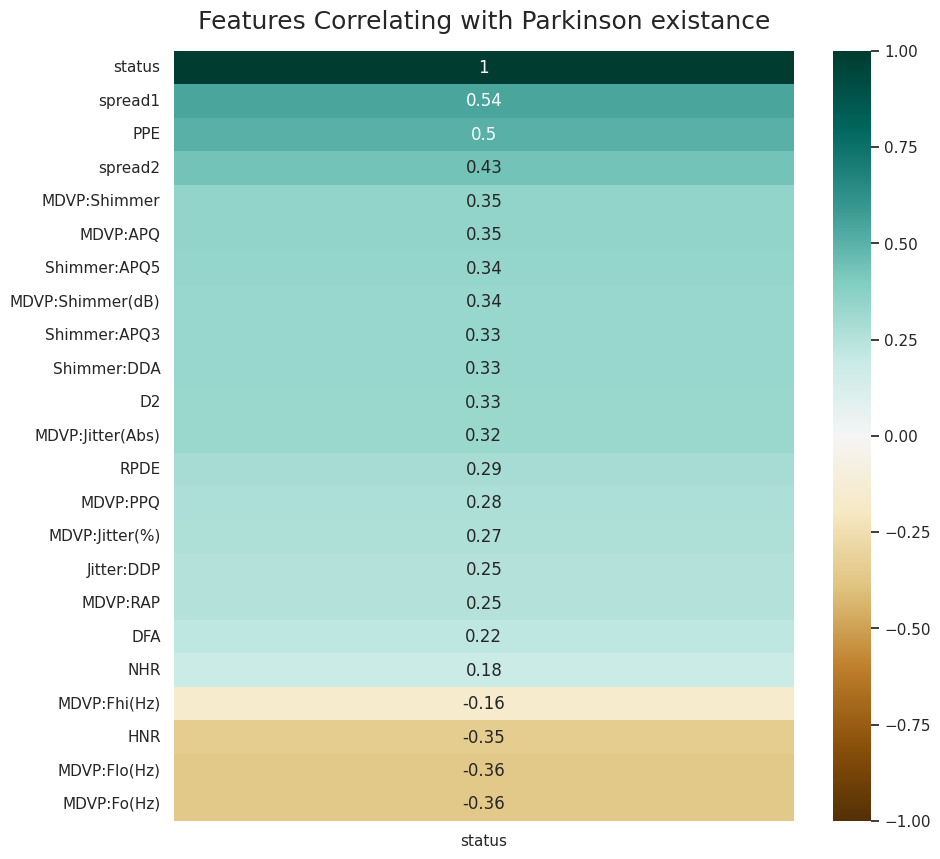

In [11]:
# modify the headmap plot to show correlation variables to the status
plt.figure(figsize=(10, 10))
heatmap = sns.heatmap(data.corr()[['status']].sort_values(by='status', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with Parkinson existance', fontdict={'fontsize':18}, pad=16);

In [12]:
X = data.drop('status', axis=1)
X.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
name,,,,,,,,,,,,,,,,,,,,,
phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.02971,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.04368,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.03590,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.03772,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.04465,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [13]:
y=data['status']
y.head()

,status
name,
phon_R01_S01_1,1.0
phon_R01_S01_2,1.0
phon_R01_S01_3,1.0
phon_R01_S01_4,1.0
phon_R01_S01_5,1.0


In [14]:
y.value_counts(normalize=True)

,proportion
status,
1.000000,0.123013
0.000000,0.040167
0.753214,0.000837
0.758071,0.000837
0.743590,0.000837
...,...
0.790818,0.000837
0.740938,0.000837
0.758922,0.000837


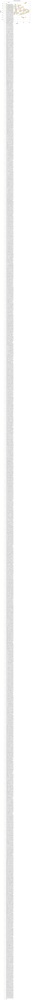

In [15]:
import seaborn as sns
from sklearn.manifold import TSNE

# Apply t-SNE to reduce the dimensions to 2
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

# Create a DataFrame with the t-SNE-transformed data and class labels
tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['Class'] = y.values

# Visualize the data based on class using a scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Class', palette='Set2')
plt.title('t-SNE Visualization')
plt.show()

In [16]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=11)


# print the shape of train and test data
print("X_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("X_test shape: ", X_test.shape)
print("y_test shape: ", y_test.shape)

X_train shape:  (836, 22)
y_train shape:  (836,)
X_test shape:  (359, 22)
y_test shape:  (359,)


In [17]:
from sklearn.neighbors import KNeighborsClassifier

In [18]:
knn = KNeighborsClassifier(n_neighbors=3)

In [20]:
from sklearn.neighbors import KNeighborsRegressor # Import KNeighborsRegressor

# ... (your existing code) ...

knn = KNeighborsRegressor(n_neighbors=3) # Change to KNeighborsRegressor
knn.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=3)

In [21]:
y_pred = knn.predict(X_test)
y_pred[0:10]

array([0.78700433, 0.        , 0.75828453, 0.75267265, 1.        ,
       0.76848342, 0.79749201, 0.73422728, 0.75542197, 0.7774277 ])

In [25]:
from sklearn.neighbors import KNeighborsRegressor # Import KNeighborsRegressor instead of KNeighborsClassifier

# ... (your existing code) ...

knn = KNeighborsRegressor(n_neighbors=3) # Use KNeighborsRegressor for continuous target variables
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
y_pred[0:10]

array([0.78700433, 0.        , 0.75828453, 0.75267265, 1.        ,
       0.76848342, 0.79749201, 0.73422728, 0.75542197, 0.7774277 ])

In [26]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


Mean Squared Error: 0.01019051602751147
R-squared: 0.6867604099437337


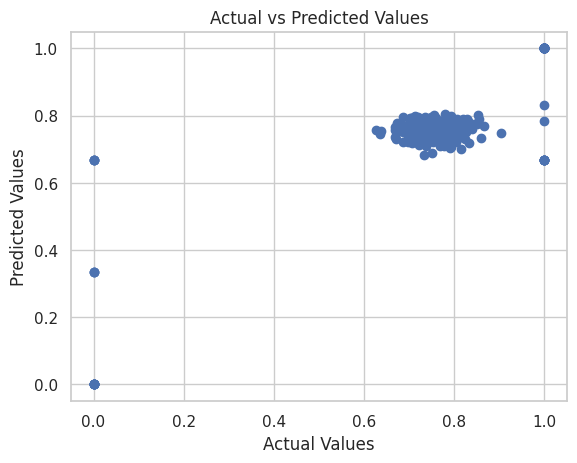

In [28]:
# Import necessary libraries
from sklearn.metrics import mean_squared_error, r2_score

# ... (your existing code for model training) ...

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model using regression metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

# Optionally, you can visualize the predictions vs actual values
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.show()

Mean Squared Error: 0.01019051602751147
R-squared: 0.6867604099437337


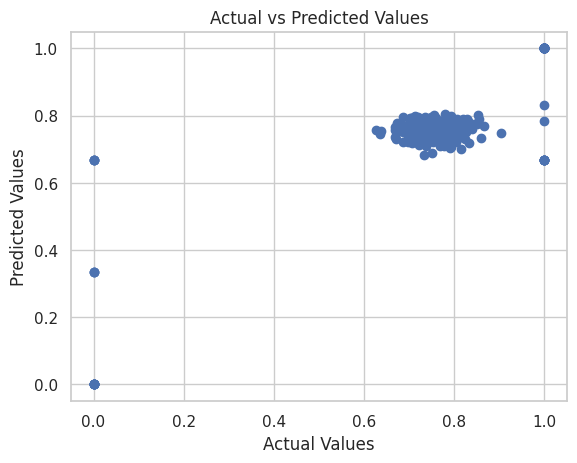

In [30]:
# Import necessary libraries
from sklearn.metrics import mean_squared_error, r2_score

# ... (your existing code for model training) ...

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model using regression metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

# Optionally, you can visualize the predictions vs actual values
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.show()

In [31]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9],

}

In [32]:
knn = KNeighborsClassifier()

In [33]:
from sklearn.model_selection import GridSearchCV


grid_search = GridSearchCV(knn, param_grid, scoring='recall', cv=5)

grid_search

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [3, 5, 7, 9]}, scoring='recall')

In [35]:
# Import necessary libraries
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor # Changed to Regressor
from sklearn.metrics import mean_squared_error, r2_score


# Initialize KNeighborsRegressor instead of KNeighborsClassifier
knn = KNeighborsRegressor()

param_grid = {
    'n_neighbors': [3, 5, 7, 9],
}

grid_search = GridSearchCV(knn, param_grid, scoring='neg_mean_squared_error', cv=5)
# Changed scoring to a regression metric

grid_search.fit(X_train, y_train)

# ... (Rest of your code for prediction and evaluation) ...

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [3, 5, 7, 9]},
             scoring='neg_mean_squared_error')

In [36]:
print("Best Parameters: ", grid_search.best_params_)
print("Best Score: ", grid_search.best_score_)

Best Parameters:  {'n_neighbors': 9}
Best Score:  -0.03016756646053012


In [37]:
y_pred = grid_search.best_estimator_.predict(X_test)

In [39]:
# Import necessary libraries
from sklearn.metrics import mean_squared_error, r2_score

# Assuming y_pred contains your model's predictions
# Calculate regression metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print("Mean Squared Error:", mse)
print("R-squared:", r2)

Mean Squared Error: 0.01618713179040337
R-squared: 0.502434370102167


In [40]:
y_hat = grid_search.best_estimator_.predict(X)

In [42]:
# Instead of using KNeighborsClassifier, import and use KNeighborsRegressor
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor() # Change KNeighborsClassifier to KNeighborsRegressor
knn.fit(X,y)

KNeighborsRegressor()

In [43]:
y_hat =knn.predict(X)

Confusion matrix, without normalization
[[  32   16]
 [   5 1142]]


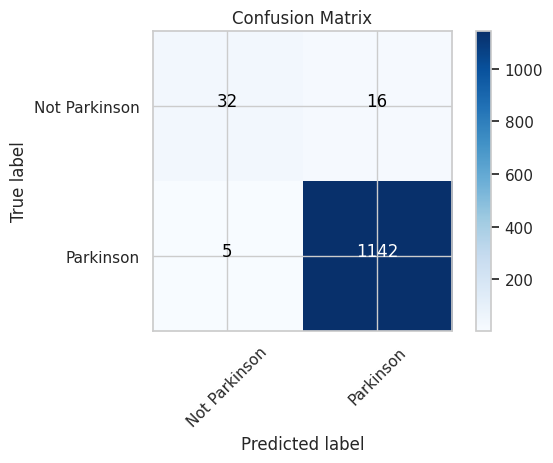

In [45]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Assuming you have already defined 'y' and 'y_hat'

# Convert predictions to binary classes based on a threshold
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = np.where(y_hat > threshold, 1, 0)
y_true_binary = np.where(y > threshold, 1, 0) # Assuming 'y' also needs to be converted
# Calculate confusion matrix for binary classes
cm = confusion_matrix(y_true_binary, y_pred_binary)


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    import itertools
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Plot the confusion matrix
plot_confusion_matrix(cm, classes=["Not Parkinson", "Parkinson"], title="Confusion Matrix")

In [46]:
# find true positives(tp)
tsne_df['label']=''
tsne_df['label'].iloc[np.where((y_hat == 1) & (y == 1))]="TP"
# find true negatives (tn)
tsne_df['label'].iloc[np.where((y_hat == 0) & (y == 0))]="TN"
# find false positives (fp)
tsne_df['label'].iloc[np.where((y_hat == 1) & (y == 0))]="FP"
# find false negatives (fp)
tsne_df['label'].iloc[np.where((y_hat == 0) & (y == 1))]="FN"

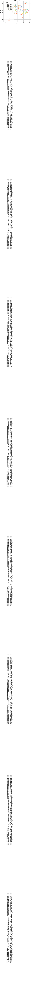

In [47]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Class', palette='Set2',style='label')
plt.title('t-SNE Visualization')
plt.show()

In [48]:
from sklearn.linear_model import LogisticRegression

In [50]:
import numpy as np
from sklearn.linear_model import LogisticRegression

# Assuming 'y_train' is a Pandas Series with continuous values
# Convert 'y_train' to binary classes based on a threshold
threshold = 0.5  # Adjust the threshold as needed
y_train_binary = np.where(y_train > threshold, 1, 0)

# Create and train the Logistic Regression model
lr = LogisticRegression()
lr.fit(X_train, y_train_binary) # Use the binary target variable for training

LogisticRegression()

In [51]:
y_pred = lr.predict(X_test)
y_pred[0:10]

array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1])

In [52]:
lr.predict_proba(X_test)[0:10]

array([[0.01994768, 0.98005232],
       [0.70059749, 0.29940251],
       [0.02251084, 0.97748916],
       [0.01379423, 0.98620577],
       [0.13767749, 0.86232251],
       [0.02512   , 0.97488   ],
       [0.02070121, 0.97929879],
       [0.02529494, 0.97470506],
       [0.0186982 , 0.9813018 ],
       [0.02259058, 0.97740942]])

Confusion matrix, without normalization
[[  7   8]
 [  2 342]]

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.47      0.58        15
           1       0.98      0.99      0.99       344

    accuracy                           0.97       359
   macro avg       0.88      0.73      0.78       359
weighted avg       0.97      0.97      0.97       359


Accuracy Score: 0.9721448467966574


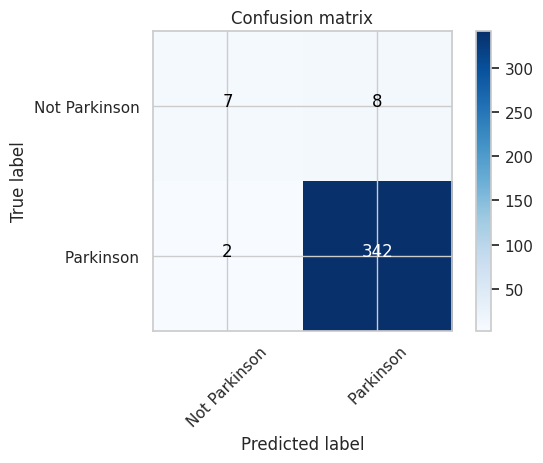

In [55]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Assuming 'y_test' is a Pandas Series with continuous values
# Convert 'y_test' to binary classes using the same threshold as during training
threshold = 0.5  # Ensure this is the same threshold used for y_train_binary
y_test_binary = np.where(y_test > threshold, 1, 0)

# Now use the binary y_test_binary for the classification metrics
plot_confusion_matrix(confusion_matrix(y_test_binary, y_pred), classes=["Not Parkinson", " Parkinson"], title='Confusion matrix')
print("\nClassification Report:\n", classification_report(y_test_binary, y_pred))
print("\nAccuracy Score:", accuracy_score(y_test_binary, y_pred))

In [56]:
coef=abs(lr.coef_[0])

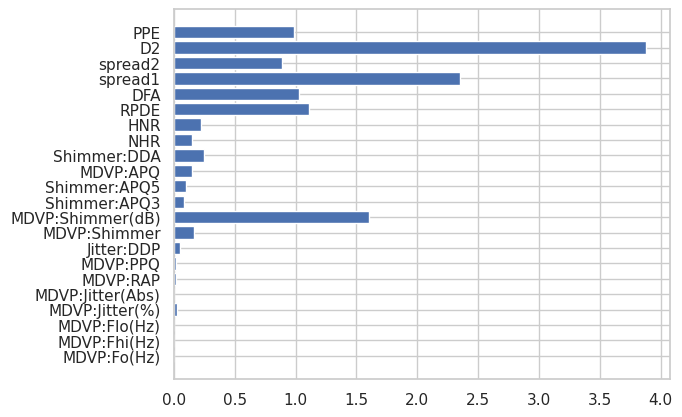

In [57]:
plt.barh(X.columns, coef)
plt.show()

In [58]:
best_columns=X.columns[np.argsort(-1*coef)[0:5]]
best_columns

Index(['D2', 'spread1', 'MDVP:Shimmer(dB)', 'RPDE', 'DFA'], dtype='object')

In [60]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Assuming 'y_train' is a Pandas Series with continuous values
# Convert 'y_train' to binary classes using a threshold
threshold = 0.5  # Choose an appropriate threshold based on your data
y_train_binary = np.where(y_train > threshold, 1, 0)

# Now use the binary y_train_binary to fit the Logistic Regression model
log_reg = LogisticRegression(max_iter=10000)
log_reg.fit(X_train[best_columns], y_train_binary)  # Use y_train_binary instead of y_train

# ... (rest of your code) ...

LogisticRegression(max_iter=10000)

In [62]:
from sklearn.svm import SVR  # Import SVR instead of SVC
# Train the SVM regressor
svm = SVR()  # Use SVR for regression tasks
svm.fit(X_train, y_train)

# Make predictions on the test set
y_hat = svm.predict(X_test)

# ... (rest of your code) ...

In [63]:
param_grid = {
    'C': [0.1, 1,],
    'gamma': [0.1, 1, 10],

}

In [65]:
from sklearn.svm import SVR # Import the Support Vector Regression model
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'C': [0.1, 1],
    'gamma': [0.1, 1, 10],
}

# Initialize the SVR model
svr = SVR()

# Create a GridSearchCV object
grid_search = GridSearchCV(svr, param_grid, scoring='neg_mean_squared_error', cv=2) # change scoring for regressor

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train) #Use X_train and y_train as before

# Print the best hyperparameters and the corresponding score
print("Best hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_) #Change to best_score_

Best hyperparameters:  {'C': 1, 'gamma': 0.1}
Best score:  -0.03250484498280076


In [67]:
from sklearn.ensemble import RandomForestRegressor # Import RandomForestRegressor
# Create a Random Forest model
rf = RandomForestRegressor(random_state=123) # Use RandomForestRegressor for continuous target

# Train the model on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = rf.predict(X_test)

# Evaluate the model's performance
# For regression, you might use metrics like mean squared error or R-squared
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error: {:.2f}".format(mse))
print("R-squared: {:.2f}".format(r2))

Mean Squared Error: 0.02
R-squared: 0.52


In [69]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor # Import RandomForestRegressor instead of Classifier


# Define the parameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 15],
    'max_features': ['sqrt', 'log2']
}

# Create a random forest regressor # Change to RandomForestRegressor
rf = RandomForestRegressor(random_state=42)

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)

# Fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)
rf.fit(X_train, y_train)

# Print the best hyperparameters
print("Best parameters:", grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100}


<Axes: >

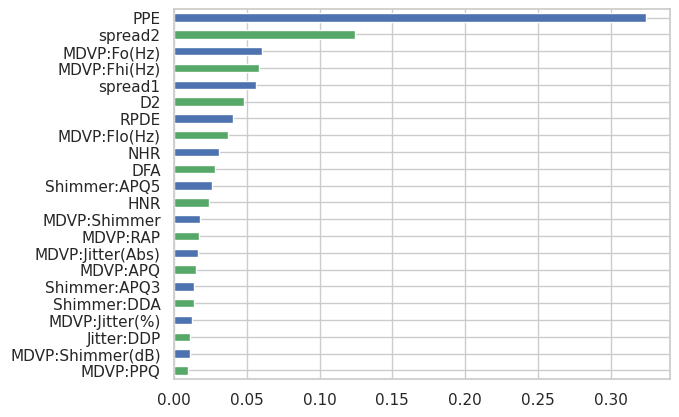

In [70]:
# plot the important features
feat_importances = pd.Series(rf.feature_importances_, index=X.columns)
feat_importances.sort_values().plot(kind='barh',color=['g','b'])

In [71]:
import pickle

# Save the model to a file
filename = 'rf_model_parkinson'
pickle.dump(rf, open(filename, "wb"))

In [73]:
from sklearn.tree import DecisionTreeRegressor # Changed to DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'], # Updated criterion options for regression
    'max_depth': [2, 4],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2]
}

# Create a decision tree regressor # Changed to DecisionTreeRegressor
dt = DecisionTreeRegressor()

# Use GridSearchCV to search for the best parameters
grid_search = GridSearchCV(dt, param_grid, cv=5, scoring='neg_mean_squared_error') # Updated scoring for regression
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", grid_search.best_params_)
print("Best recall score:", grid_search.best_score_)

Best parameters: {'criterion': 'friedman_mse', 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best recall score: -0.019672070163759468


In [74]:
clf=grid_search.best_estimator_
#same as
#clf = DecisionTreeClassifier(max_depth=2, min_samples_leaf=1, min_samples_split=2, criterion= 'entropy')
#clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

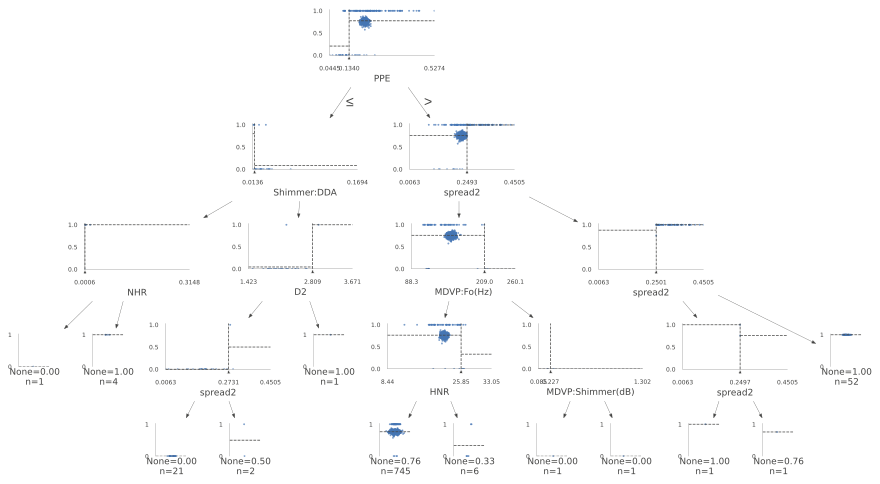

In [75]:
# plot the tree
import dtreeviz

# Getting the list of variables
feature_names = list(X_train.columns)

# visualizing the tree
viz_model = dtreeviz.model(clf,
                           X_train=X_train, y_train=y_train,
                           feature_names=feature_names)

v = viz_model.view(fancy=True)     # render as SVG into internal object
v

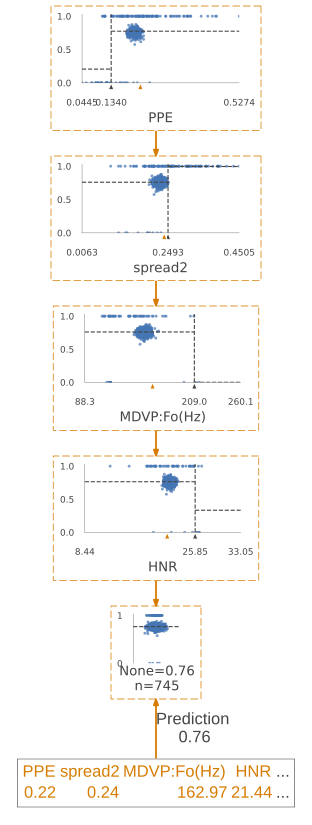

In [76]:
# get a random point
rand = np.random.randint(0, len(X))
sample_point = X.iloc[rand,:].values

# visualizing the path for the point
v = viz_model.view(fancy=True,scale=1.5,x=sample_point,show_just_path=True)
v